<a href="https://colab.research.google.com/github/anramz29/Applied_Machine_Learning/blob/main/HW6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [184]:
import os
import tensorflow as tf
# Load compressed models from tensorflow_hub
os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'

import IPython.display as display

import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False

import numpy as np
import PIL.Image
import time
import functools

In [185]:

def load_img(path_to_img):
  max_dim = 512
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img


def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

##1: Find your own images to work with, both in terms of style and content. What happens if you use the same image for both?

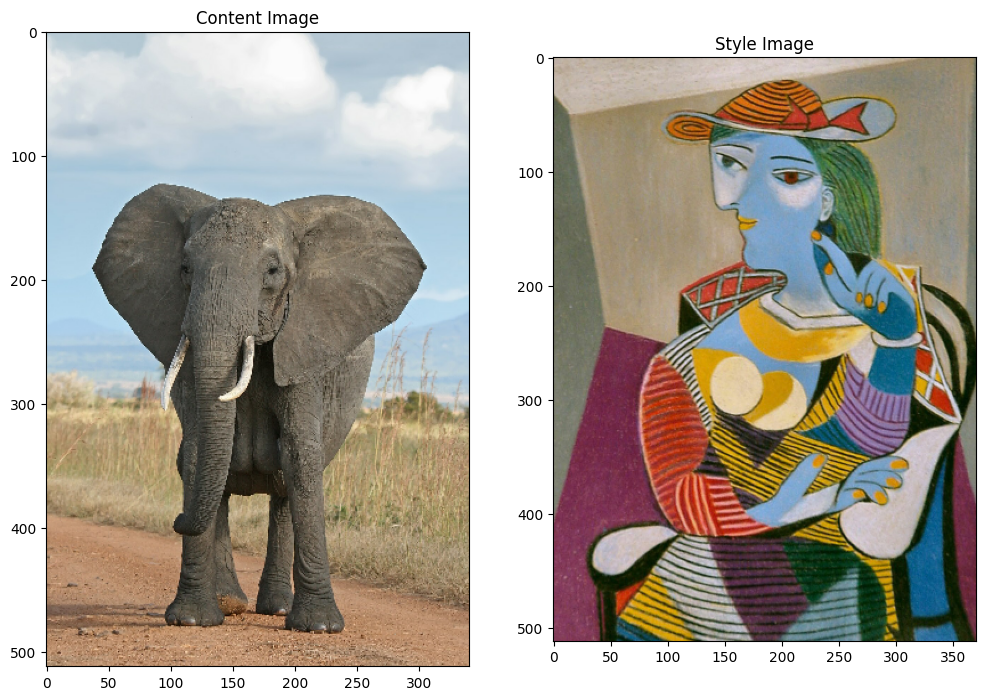

In [186]:
DIR_PATH = "/content/drive/MyDrive/week12/"

content_path = DIR_PATH + "African_Bush_Elephant.jpg"
style_path = DIR_PATH + "picasso.jpg"

content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

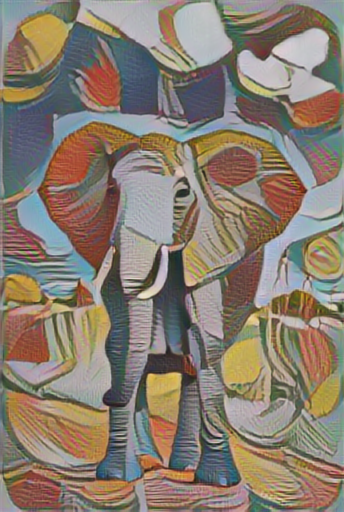

In [187]:
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

# Use the Same image for both

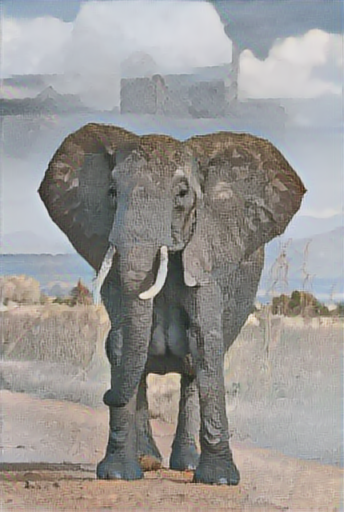

In [188]:
stylized_image_2 = hub_model(tf.constant(content_image), tf.constant(content_image))[0]
tensor_to_image(stylized_image_2)

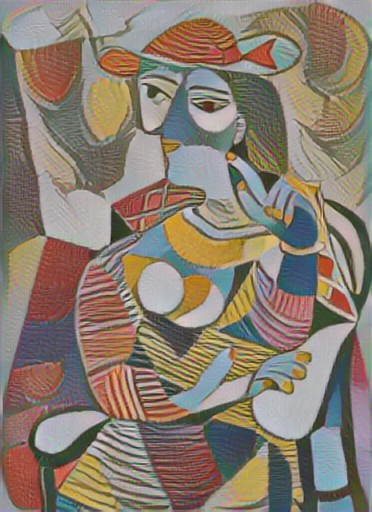

In [189]:
stylized_image_3 = hub_model(tf.constant(style_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image_3)

Notes

- When I use the same image in the hub model, the results remain quite similar, but due to the fact that the neural network reconstrucs the image with a degree of approximation.

##2. The tutorial uses a very abstract style image and a very realistic content image. What happens if we reverse this? E.g. try using a very realistic style image and a cartoon for the content.

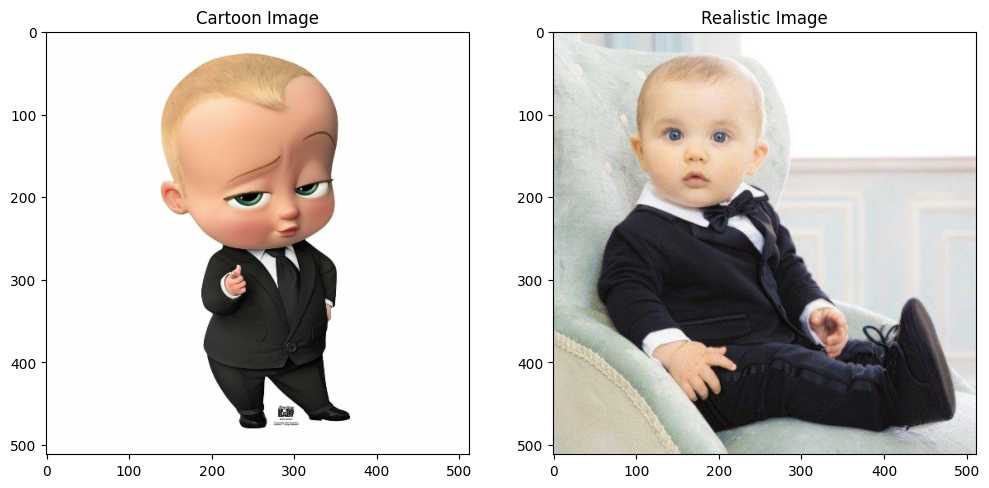

In [190]:
cartoon_path = DIR_PATH + "bossbaby.jpg"
realistic_path = DIR_PATH + "BabyInSuit.jpg"

cartoon_image = load_img(cartoon_path)
realistic_image = load_img(realistic_path)

plt.subplot(1, 2, 1)
imshow(cartoon_image, 'Cartoon Image')

plt.subplot(1, 2, 2)
imshow(realistic_image, 'Realistic Image')

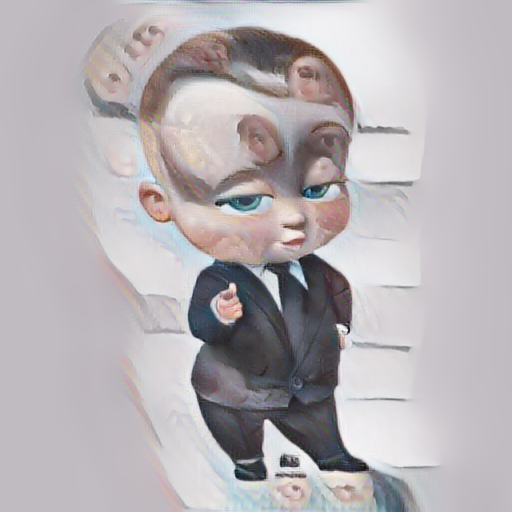

In [191]:
stylized_image_4 = hub_model(tf.constant(cartoon_image), tf.constant(realistic_image))[0]
tensor_to_image(stylized_image_4)

In [192]:
x = tf.keras.applications.vgg19.preprocess_input(content_image*255)
x = tf.image.resize(x, (224, 224))
vgg = tf.keras.applications.VGG19(include_top=True, weights='imagenet')
prediction_probabilities = vgg(x)
prediction_probabilities.shape

TensorShape([1, 1000])

In [193]:
predicted_top_5 = tf.keras.applications.vgg19.decode_predictions(prediction_probabilities.numpy())[0]
[(class_name, prob) for (number, class_name, prob) in predicted_top_5]

[('African_elephant', np.float32(0.9676481)),
 ('tusker', np.float32(0.03164018)),
 ('Indian_elephant', np.float32(0.0006180477)),
 ('triceratops', np.float32(9.120778e-05)),
 ('warthog', np.float32(1.2101771e-06))]

In [194]:
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

print()
for layer in vgg.layers:
  print(layer.name)


input_layer_24
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [195]:
content_layers = ['block5_conv2']

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1',
                'block4_conv1',
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In [196]:
def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result/(num_locations)

In [197]:
class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__()
    self.vgg = vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False

  def call(self, inputs):
    "Expects float input in [0,1]"
    inputs = inputs*255.0
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    outputs = self.vgg(preprocessed_input)
    style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                      outputs[self.num_style_layers:])

    style_outputs = [gram_matrix(style_output)
                     for style_output in style_outputs]

    content_dict = {content_name: value
                    for content_name, value
                    in zip(self.content_layers, content_outputs)}

    style_dict = {style_name: value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}

    return {'content': content_dict, 'style': style_dict}

In [198]:
extractor = StyleContentModel(style_layers, content_layers)

results = extractor(tf.constant(content_image))

print('Styles:')
for name, output in sorted(results['style'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print()

print("Contents:")
for name, output in sorted(results['content'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())

Styles:
   block1_conv1
    shape:  (1, 64, 64)
    min:  0.08054735
    max:  44065.14
    mean:  324.10092

   block2_conv1
    shape:  (1, 128, 128)
    min:  0.0
    max:  60919.176
    mean:  9918.748

   block3_conv1
    shape:  (1, 256, 256)
    min:  0.0
    max:  261370.1
    mean:  9151.807

   block4_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  1736763.0
    mean:  146541.17

   block5_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  71988.23
    mean:  1258.238

Contents:
   block5_conv2
    shape:  (1, 32, 21, 512)
    min:  0.0
    max:  1163.0648
    mean:  13.468187


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_578']
Received: inputs=Tensor(shape=(1, 512, 341, 3))
  warnings.warn(msg)


In [199]:
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_578']
Received: inputs=Tensor(shape=(1, 512, 371, 3))
  warnings.warn(msg)


In [200]:
def vgg_layers(layer_names):
  """ Creates a VGG model that returns a list of intermediate output values."""
  # Load our model. Load pretrained VGG, trained on ImageNet data
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False

  outputs = [vgg.get_layer(name).output for name in layer_names]

  model = tf.keras.Model([vgg.input], outputs)
  return model

style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)

#Look at the statistics of each layer's output
for name, output in zip(style_layers, style_outputs):
  print(name)
  print("  shape: ", output.numpy().shape)
  print("  min: ", output.numpy().min())
  print("  max: ", output.numpy().max())
  print("  mean: ", output.numpy().mean())
  print()

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_600']
Received: inputs=Tensor(shape=(1, 512, 371, 3))
  warnings.warn(msg)


block1_conv1
  shape:  (1, 512, 371, 64)
  min:  0.0
  max:  722.5684
  mean:  29.360434

block2_conv1
  shape:  (1, 256, 185, 128)
  min:  0.0
  max:  3714.6438
  mean:  159.87439

block3_conv1
  shape:  (1, 128, 92, 256)
  min:  0.0
  max:  7168.411
  mean:  167.94258

block4_conv1
  shape:  (1, 64, 46, 512)
  min:  0.0
  max:  16584.639
  mean:  589.99396

block5_conv1
  shape:  (1, 32, 23, 512)
  min:  0.0
  max:  2733.5356
  mean:  50.279785



In [201]:
image = tf.Variable(content_image)

In [202]:
def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [203]:
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

In [204]:
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2)
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2)
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss

In [205]:
style_weight=1e5

content_weight=1e4

In [206]:
@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

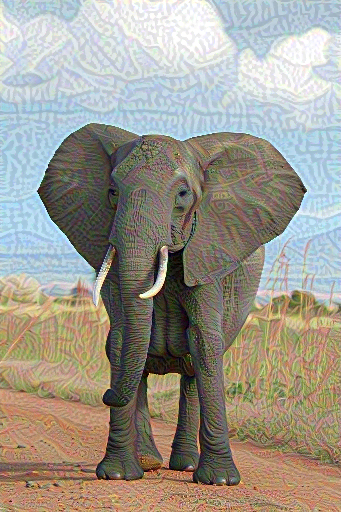

In [207]:
train_step(image)
train_step(image)
train_step(image)
tensor_to_image(image)

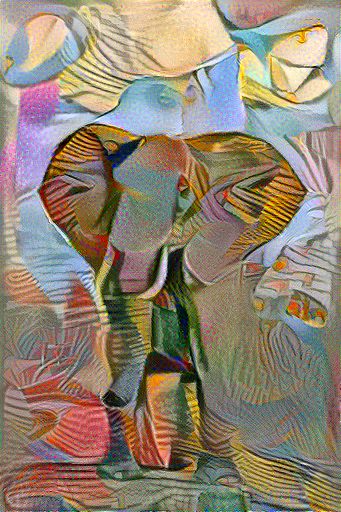

Train step: 1000
Total time: 67.6


In [208]:
import time
start = time.time()

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

In [209]:
def high_pass_x_y(image):
  x_var = image[:, :, 1:, :] - image[:, :, :-1, :]
  y_var = image[:, 1:, :, :] - image[:, :-1, :, :]

  return x_var, y_var

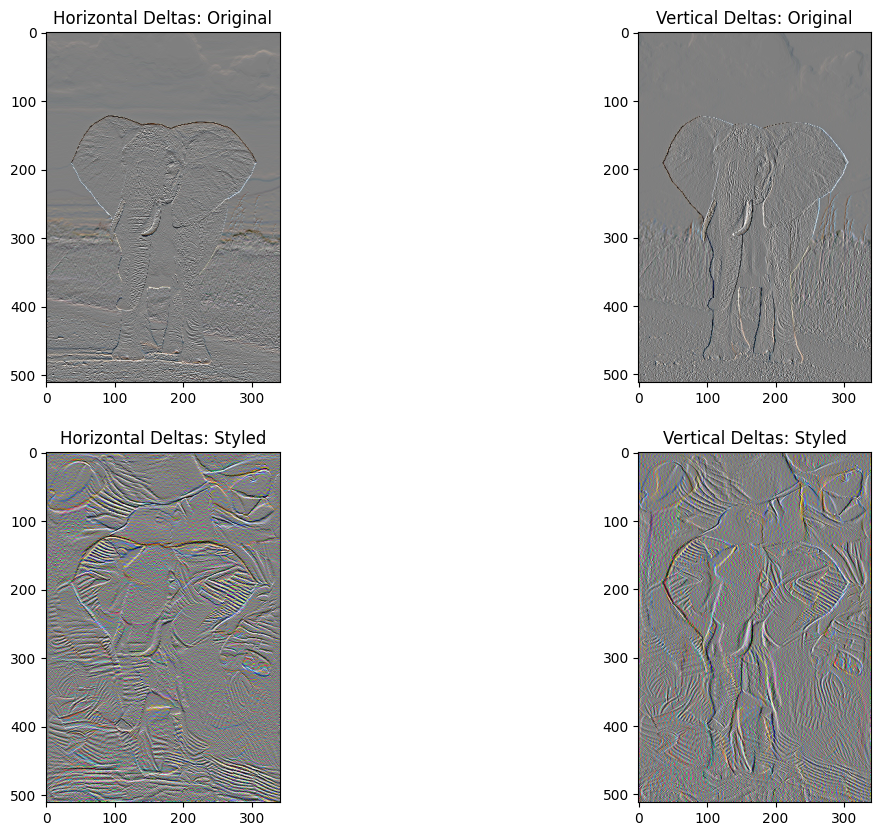

In [210]:
x_deltas, y_deltas = high_pass_x_y(content_image)

plt.figure(figsize=(14, 10))
plt.subplot(2, 2, 1)
imshow(clip_0_1(2*y_deltas+0.5), "Horizontal Deltas: Original")

plt.subplot(2, 2, 2)
imshow(clip_0_1(2*x_deltas+0.5), "Vertical Deltas: Original")

x_deltas, y_deltas = high_pass_x_y(image)

plt.subplot(2, 2, 3)
imshow(clip_0_1(2*y_deltas+0.5), "Horizontal Deltas: Styled")

plt.subplot(2, 2, 4)
imshow(clip_0_1(2*x_deltas+0.5), "Vertical Deltas: Styled")

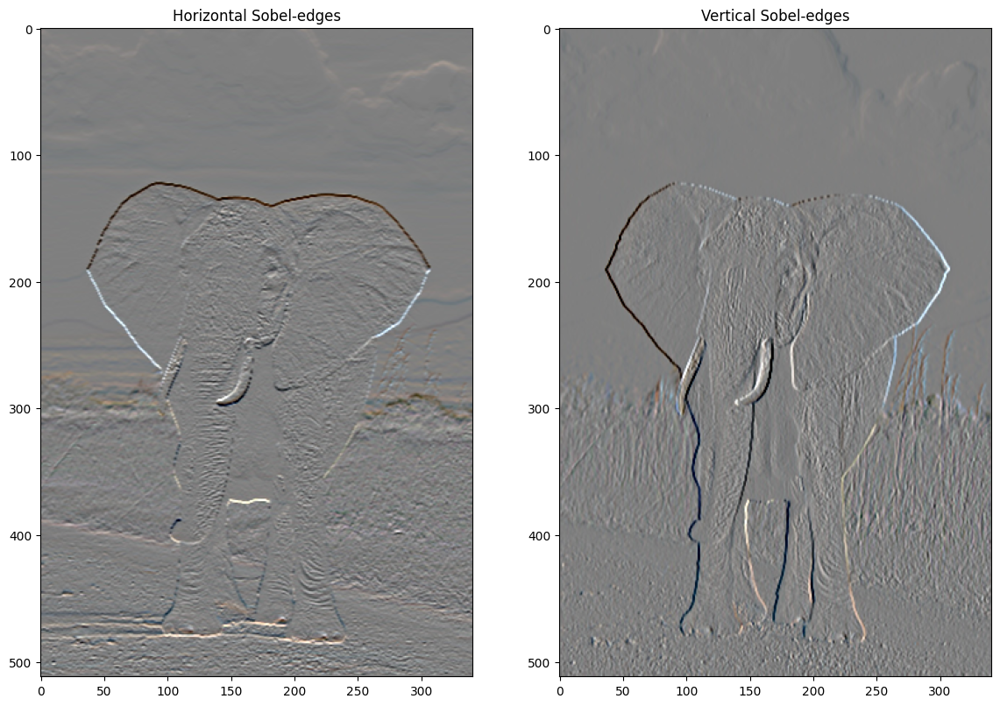

In [211]:
plt.figure(figsize=(14, 10))

sobel = tf.image.sobel_edges(content_image)
plt.subplot(1, 2, 1)
imshow(clip_0_1(sobel[..., 0]/4+0.5), "Horizontal Sobel-edges")
plt.subplot(1, 2, 2)
imshow(clip_0_1(sobel[..., 1]/4+0.5), "Vertical Sobel-edges")

In [212]:
def total_variation_loss(image):
  x_deltas, y_deltas = high_pass_x_y(image)
  return tf.reduce_sum(tf.abs(x_deltas)) + tf.reduce_sum(tf.abs(y_deltas))


total_variation_loss(image).numpy()


total_variation_loss(image).numpy()

np.float32(88382.71)

In [213]:
total_variation_weight=30

@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)
    loss += total_variation_weight*tf.image.total_variation(image)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

In [214]:
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
image = tf.Variable(content_image)

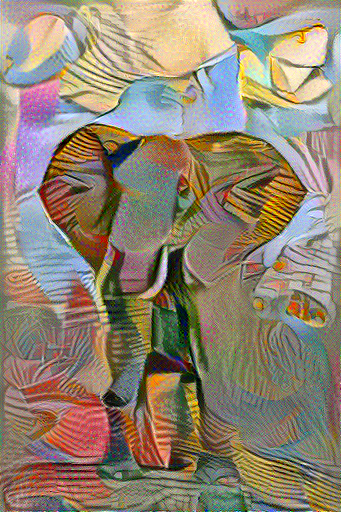

Train step: 1000
Total time: 68.6


In [215]:
import time
start = time.time()

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

In [216]:
# My own expirement trying to


def vertical_edge_loss(generated_image, target_image=None, weight=1.0):
    # Convert to grayscale
    gen_gray = tf.image.rgb_to_grayscale(generated_image)

    # Compute Sobel edges
    gen_edges = tf.image.sobel_edges(gen_gray)[..., 0]  # vertical edges

    if target_image is not None:
        tgt_gray = tf.image.rgb_to_grayscale(target_image)
        tgt_edges = tf.image.sobel_edges(tgt_gray)[..., 0]
        edge_loss = tf.reduce_mean(tf.square(gen_edges - tgt_edges))
    else:
        # encourage strong vertical edges
        edge_loss = -tf.reduce_mean(tf.abs(gen_edges))
    return weight * edge_loss


def combined_loss(outputs, image,
                  content_target=None,
                  style_weight=1.0,
                  content_weight=1.0,
                  tv_weight=0.0,
                  vertical_edge_weight=0.0):

    # Your existing style/content loss
    loss = style_content_loss(outputs)

    # Total variation loss
    loss += tv_weight * total_variation_loss(image)

    # Vertical edge loss
    loss += vertical_edge_weight * vertical_edge_loss(image, content_target)

    return loss




@tf.function()
def train_step2(image, content_target, tv_weight=0.0, vertical_edge_weight=0.0):
    with tf.GradientTape() as tape:
        outputs = extractor(image)
        loss = combined_loss(outputs, image,
                             content_target=content_target,
                             tv_weight=tv_weight,
                             vertical_edge_weight=vertical_edge_weight)
    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(clip_0_1(image))




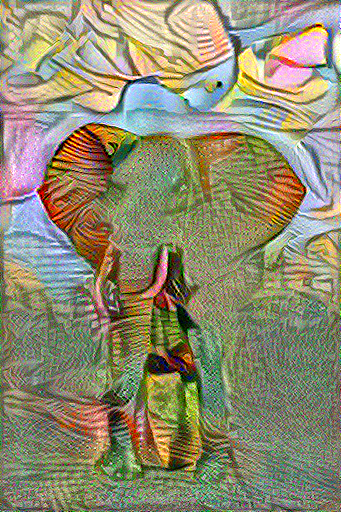


Epoch 5/5 - Step 250
Total time: 17.8s


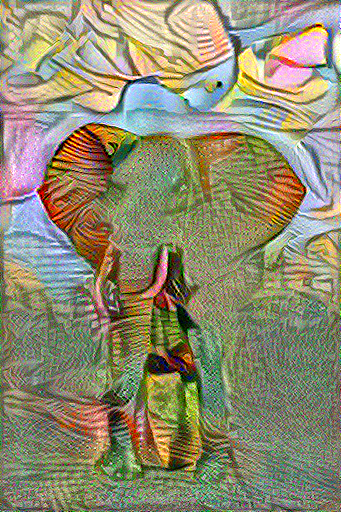

In [217]:
def run_experiment(tv_weight, vertical_edge_weight, epochs=5, steps_per_epoch=50):
    print(f"Running experiment: TV={tv_weight}, VerticalEdge={vertical_edge_weight}")
    image.assign(content_image)  # Reset image

    start = time.time()
    step = 0

    for n in range(epochs):
        for m in range(steps_per_epoch):
            step += 1
            train_step2(image, content_image,
                       tv_weight=tv_weight,
                       vertical_edge_weight=vertical_edge_weight)
            print(".", end='', flush=True)

        display.clear_output(wait=True)
        display.display(tensor_to_image(image))
        print(f"\nEpoch {n+1}/{epochs} - Step {step}")

    end = time.time()
    print("Total time: {:.1f}s".format(end - start))
    display.display(tensor_to_image(image))

run_experiment(tv_weight=100, vertical_edge_weight=5.0)


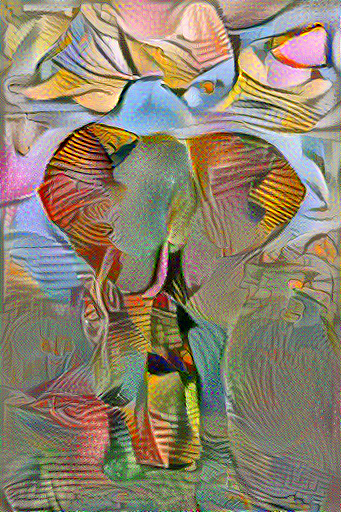

Train step: 1000
Total time: 67.2


In [218]:
content_layers = ['block5_conv2']

style_layers = ['block1_conv1']



num_content_layers = len(content_layers)
num_style_layers = len(style_layers)


extractor = StyleContentModel(style_layers, content_layers)
style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)
image = tf.Variable(content_image)
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)


import time
start = time.time()

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))



Investigation:

1. I didn't understand the `tf.einsum()` method, I found the explaination here [tensor flow docs](https://www.tensorflow.org/api_docs/python/tf/einsum), now I understand that the `gram_matrix` and it's relation to the `StyleContentModel` which is taking the feature maps and finding the correlation between them. For example finding the corrleation between curves, and stripes in a certain layer.

2. Now that I have a better understanding of what the `StyleContentModel` class is doing, it seems like the outputs are the same between with the `vgg_layers`. I don't understand what the difference is between the two. I now understand the difference. The issue
was that I didn't really have a good idea of what a [tensor](https://www.w3schools.com/ai/ai_tensors.asp) is. Now I understand this shape `(1, 512, 371, 64)` can be better thought of as a stack of 3 dimensional martix's.

3. I didn't understand the `tf.GradientTape()` method. After reading the [documentation](https://www.tensorflow.org/api_docs/python/tf/GradientTape), and asking chatgbt to explain to the `train_step()` method I now understand what is going on. Simply the function extracts the loss from the generated image, computes the `gradient_loss` with the `gradient_tape`, then applies the gradient steps on the optimizer, and finally clips the pixels outside of the range between [0,1].

The rest of the parts of the network I understand, but I did take a lot of time focusing on these three investigations above.


Expirements:

1. I was wondering how changing the total variation weight would do to the photo, specfically how is would change the elephants left leg doesn't seem to be recognized. I moved it from 30->50, this lead to a generally more noisy image, then when moving it from 30->10 I got a cripser image but didn't solve the issue of the network.

2. What if I used a carton with a realistic image? When I use a cartoon style image I obtain some very unatural results, as the realistic style image clash with the simple cartoon style.

3. When I use the same image in the hub model, the results remain quite similar, but due to the fact that the neural network reconstrucs the image with a degree of approximation.


4. I was wondering if I could fix some of the issue with the right leg not being notacable because of the noise. Therefore I tried to create my own loss function to prioritize vertical edges this led to worse results, as seen in the results above.

5. I expiremented with just extracting two style layers, I think the lack of the layers in the network, lead to these noisy results.



